In [1]:
import random

import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity
from torchvision import models
from ultralytics import YOLO

In [2]:
class VeriWildModel(nn.Module):
    def __init__(self):
        super(VeriWildModel, self).__init__()
        self.backbone = models.resnet50(pretrained=False)
        num_features = self.backbone.fc.in_features
        self.backbone.fc = nn.Linear(num_features, 1000)
    
    def forward(self, x):
        x = self.backbone(x)
        return x

In [3]:
veriwild_model = VeriWildModel()

/home/abhijithganesh/miniconda3/envs/torch/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/abhijithganesh/miniconda3/envs/torch/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


In [4]:
model_weights_path = '/home/abhijithganesh/bmc/bmc24/models/veriwild.pth'
checkpoint = torch.load(model_weights_path)
state_dict = checkpoint['model']
veriwild_model.load_state_dict(state_dict, strict=False)
veriwild_model.eval()

VeriWildModel(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
   

In [5]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),  
    transforms.ToTensor(),  
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  
])

In [6]:
detection_model = YOLO("/home/abhijithganesh/bmc/bmc24/models/prenabhi-noaug-30.pt")

In [7]:
def random_color():
    return [random.randint(0, 255) for _ in range(3)]

def get_vehicle_embeddings(image_path, model, detection_model):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_copy = image.copy()
    
    image_pil = Image.fromarray(image)

    results = detection_model(image_pil)
    
    boxes = results[0].boxes.xyxy.cpu().numpy()  
    scores = results[0].boxes.conf.cpu().numpy() 
    labels = results[0].boxes.cls.cpu().numpy()  
 
    confidence_threshold = 0.5
    indices = scores > confidence_threshold
    boxes = boxes[indices]
    labels = labels[indices]
    
    embeddings_list = []
    class_names = []
    color_map = {}
    
    for box, label in zip(boxes, labels):
        x_min, y_min, x_max, y_max = map(int, box)
        
        if label not in color_map:
            color_map[label] = random_color()
        
        color = color_map[label]
        cv2.rectangle(image_copy, (x_min, y_min), (x_max, y_max), color, 2)
        cv2.putText(image_copy, str(label), (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, color, 2)
        
        cropped_img = image[y_min:y_max, x_min:x_max]
        cropped_img_pil = Image.fromarray(cropped_img)
        
        input_tensor = transform(cropped_img_pil).unsqueeze(0)
        
        with torch.no_grad():
            embeddings = model(input_tensor)
        
        embeddings_list.append(embeddings.cpu().numpy())
        class_names.append(label)
    
    return embeddings_list, class_names, image_copy

In [8]:
def compare_embeddings(embeddings1, embeddings2, class_names1, class_names2):
    embeddings1 = np.vstack(embeddings1)
    embeddings2 = np.vstack(embeddings2)
    similarity_matrix = cosine_similarity(embeddings1, embeddings2)
    class_map1 = {i: class_name for i, class_name in enumerate(class_names1)}
    class_map2 = {i: class_name for i, class_name in enumerate(class_names2)}
    return similarity_matrix, class_map1, class_map2

def display_image_with_boxes(image, title='Image with Bounding Boxes'):
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')
    plt.show()

Using cache found in /home/abhijithganesh/.cache/torch/hub/XingangPan_IBN-Net_master


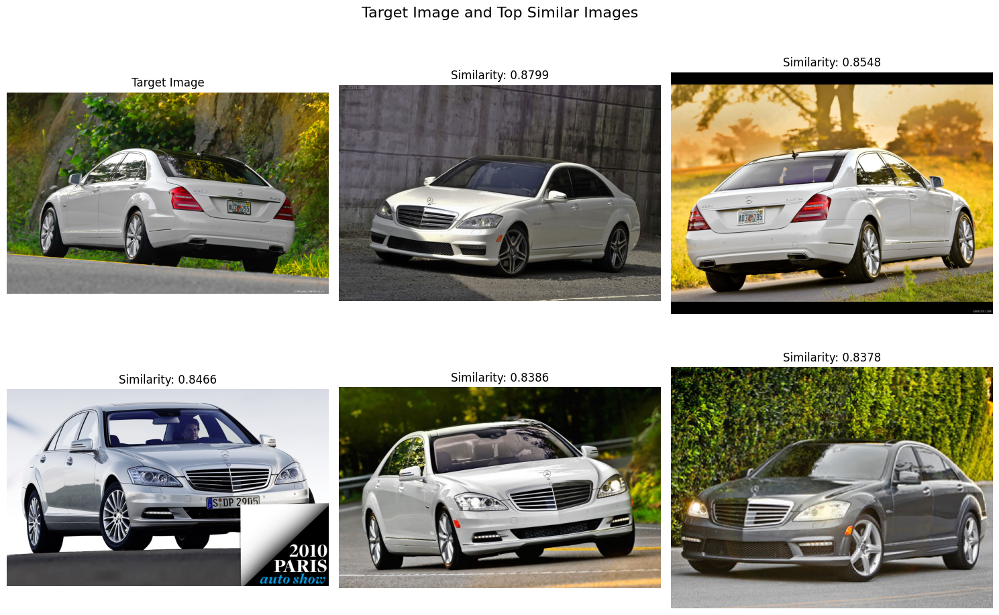

In [13]:
import os
import glob
import torch
import numpy as np
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# Load the ResNet50-IBN-A model
model = torch.hub.load('XingangPan/IBN-Net', 'resnet50_ibn_a', pretrained=True)
model.eval()

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

def find_jpeg_files(folder_path):
    return glob.glob(os.path.join(folder_path, '*.jpg'))

def get_image_embedding(image_path, model):
    image = Image.open(image_path).convert('RGB')
    input_tensor = transform(image).unsqueeze(0)  # Add batch dimension
    with torch.no_grad():
        embedding = model(input_tensor)
    return embedding.cpu().numpy()

def cosine_similarity(embedding1, embedding2):
    embedding1 = embedding1.flatten()
    embedding2 = embedding2.flatten()
    return np.dot(embedding1, embedding2) / (np.linalg.norm(embedding1) * np.linalg.norm(embedding2))

def compare_images_in_folder_against_target(folder_path, target_image_path, model, top_n=5):
    jpeg_files = find_jpeg_files(folder_path)
    target_embedding = get_image_embedding(target_image_path, model)
    
    similarities = []
    for image_path in jpeg_files:
        if image_path == target_image_path:
            continue
        embedding = get_image_embedding(image_path, model)
        similarity = cosine_similarity(target_embedding, embedding)
        similarities.append((image_path, similarity))
    
    similarities.sort(key=lambda x: x[1], reverse=True)
    top_similar = similarities[:top_n]
    
    return top_similar

def visualize_similar_images(folder_path, target_image_path, model, top_n=5):
    top_similar = compare_images_in_folder_against_target(folder_path, target_image_path, model, top_n)
    
    # Create a figure with subplots
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    fig.suptitle("Target Image and Top Similar Images", fontsize=16)
    
    # Display target image
    target_img = Image.open(target_image_path)
    axes[0, 0].imshow(target_img)
    axes[0, 0].set_title("Target Image")
    axes[0, 0].axis('off')
    
    # Display similar images
    for idx, (img_path, similarity) in enumerate(top_similar):
        img = Image.open(img_path)
        row = (idx + 1) // 3
        col = (idx + 1) % 3
        axes[row, col].imshow(img)
        axes[row, col].set_title(f"Similarity: {similarity:.4f}")
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage:
# folder_path = '/home/abhijithganesh/bmc/cars/car_data/train/Infiniti QX56 SUV 2011/'
folder_path = '/home/abhijithganesh/bmc/cars/car_data/train/Mercedes-Benz S-Class Sedan 2012/'
image_path = '/home/abhijithganesh/bmc/cars/car_data/test/Mercedes-Benz S-Class Sedan 2012/00008.jpg'
visualize_similar_images(folder_path, image_path, model)


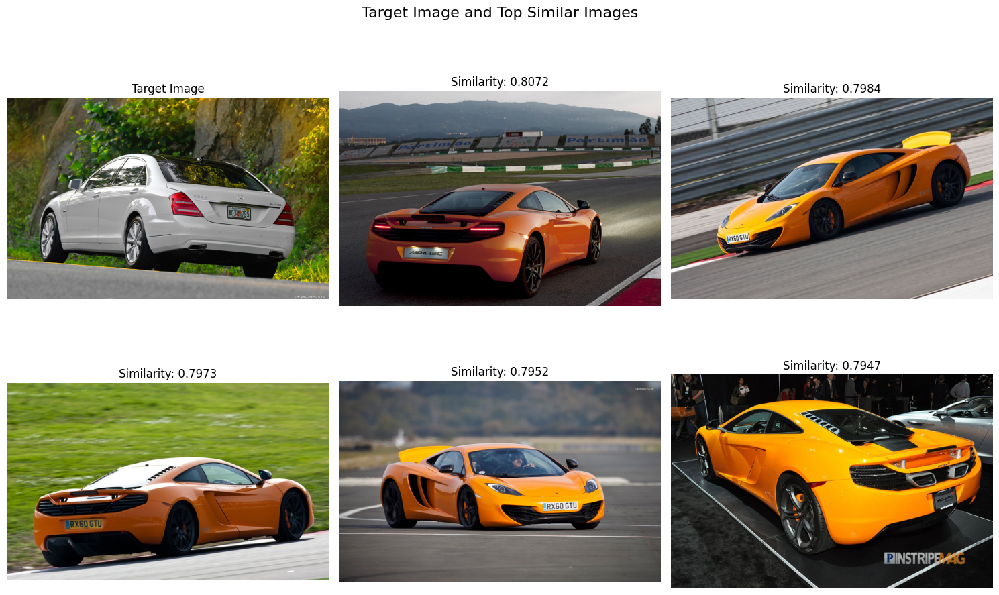

In [15]:
folder_path = '/home/abhijithganesh/bmc/cars/car_data/train/McLaren MP4-12C Coupe 2012/'
image_path = '/home/abhijithganesh/bmc/cars/car_data/test/Mercedes-Benz S-Class Sedan 2012/00008.jpg'
visualize_similar_images(folder_path, image_path, model)

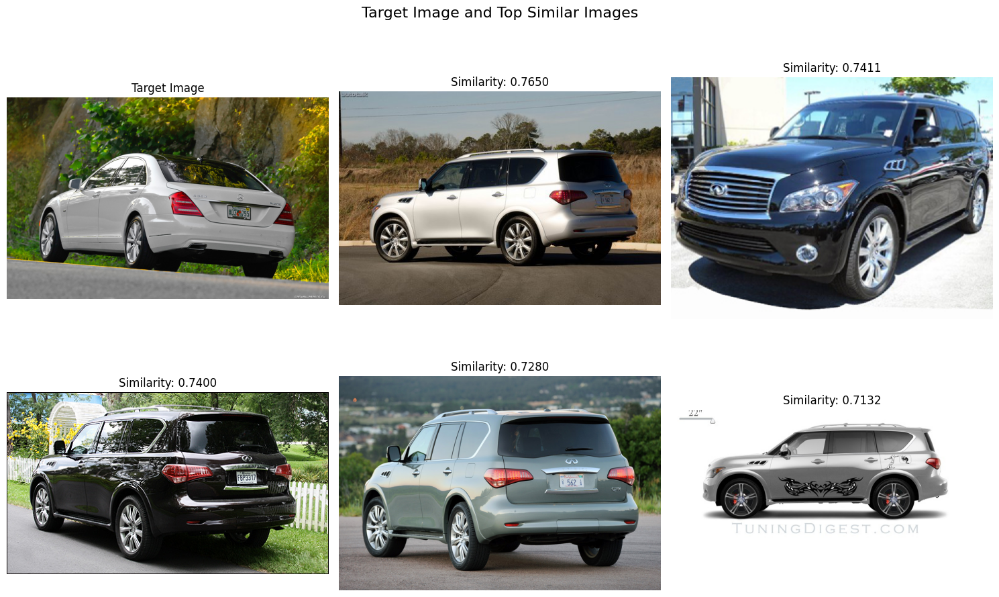

In [14]:
folder_path = '/home/abhijithganesh/bmc/cars/car_data/train/Infiniti QX56 SUV 2011/'
image_path = '/home/abhijithganesh/bmc/cars/car_data/test/Mercedes-Benz S-Class Sedan 2012/00008.jpg'
visualize_similar_images(folder_path, image_path, model)

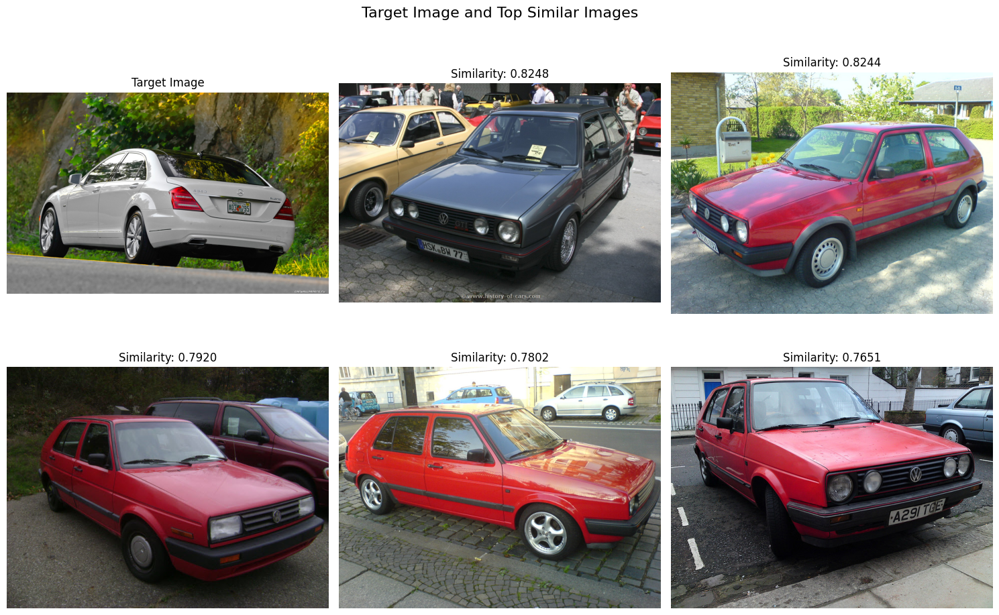

In [16]:
folder_path = '/home/abhijithganesh/bmc/cars/car_data/train/Volkswagen Golf Hatchback 1991/'
image_path = '/home/abhijithganesh/bmc/cars/car_data/test/Mercedes-Benz S-Class Sedan 2012/00008.jpg'
visualize_similar_images(folder_path, image_path, model)

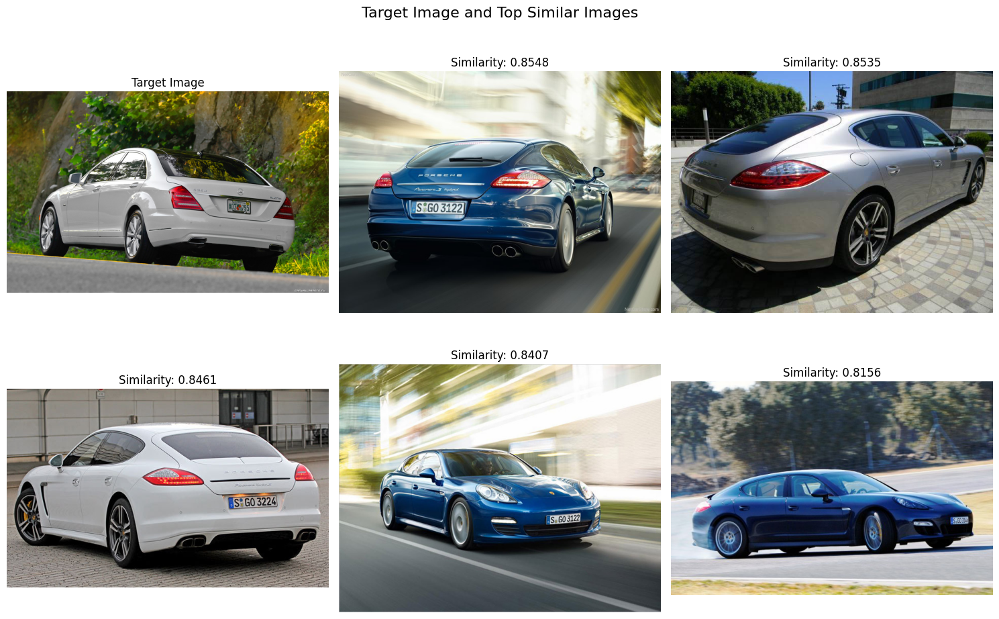

In [17]:
folder_path = '/home/abhijithganesh/bmc/cars/car_data/train/Porsche Panamera Sedan 2012'
image_path = '/home/abhijithganesh/bmc/cars/car_data/test/Mercedes-Benz S-Class Sedan 2012/00008.jpg'
visualize_similar_images(folder_path, image_path, model)

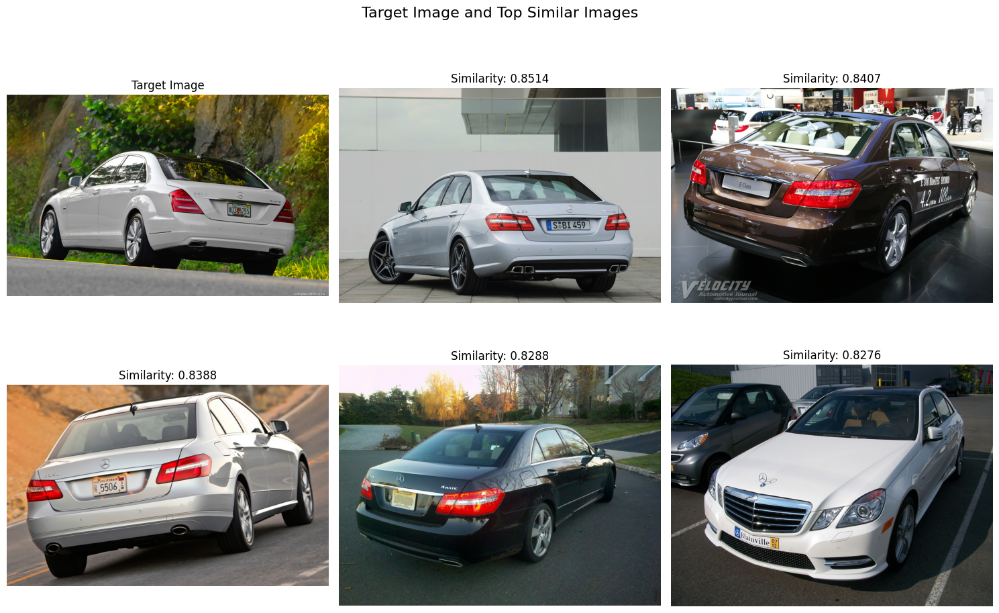

In [18]:
folder_path = '/home/abhijithganesh/bmc/cars/car_data/train/Mercedes-Benz E-Class Sedan 2012'
image_path = '/home/abhijithganesh/bmc/cars/car_data/test/Mercedes-Benz S-Class Sedan 2012/00008.jpg'
visualize_similar_images(folder_path, image_path, model)

In [20]:
from torchvision.models import resnet50

model = torch.hub.load("AbhijithGanesh/IBN-Net", 'resnet50_ibn_a', pretrained=True)
# model.load_state_dict(torch.load('resnet50_ibn_a.pth'))
model.eval()

/home/abhijithganesh/miniconda3/envs/torch/lib/python3.12/site-packages/torch/hub.py:295: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/AbhijithGanesh/IBN-Net/zipball/master" to /home/abhijithganesh/.cache/torch/hub/master.zip


ResNet_IBN(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck_IBN(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): IBN(
        (IN): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=False)
        (BN): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stat